In [1]:
import os
import cv2
import numpy as np
import imutils
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/CNN/roots'
print("Исходный путь к рабочей директории: ", os.getcwd())
os.chdir(path)
print("Новый путь к рабочей директории: ", os.getcwd())
from google.colab.patches import cv2_imshow

Mounted at /content/drive
Исходный путь к рабочей директории:  /content
Новый путь к рабочей директории:  /content/drive/MyDrive/CNN/roots


In [2]:
!pip install altair==5.0.0rc1
!pip install plantcv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.5/709.5 kB 11.7 MB/s eta 0:00:00
  Attempting uninstall: altair
    Found existing installation: altair 4.2.2
    Uninstalling altair-4.2.2:
      Successfully uninstalled altair-4.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 327.9/327.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.7/27.7 MB 52.9 MB/s eta 0:00:00


In [3]:
from plantcv import plantcv as pcv
from plantcv.parallel import WorkflowInputs

In [4]:
#отрисовка контуров на первичном сыром изображении
def image_contour(image):
  raw = image.copy()

  # Примените фильтр медианного размытия
  blurred_image = cv2.medianBlur(image, 5)

  # Создайте фильтр уточнения границ
  kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

  # Примените фильтр к изображению
  sharp_image = cv2.filter2D(blurred_image, -1, kernel)

  # Преобразуйте изображение в градации серого
  gray = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2GRAY)

  # Создайте экземпляр фильтра CLAHE
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

  # Примените фильтр CLAHE к градациям серого изображения
  contrast_enhanced = clahe.apply(gray)

  _, thresh = cv2.threshold(contrast_enhanced, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


  # Поиск контуров на бинаризованном изображении

  #contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contours, _ = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

  return(contours, raw, contrast_enhanced)

#отрисовка контура чашки на изображении, чтобы потом по нему создать маску
def image_petri_cnt(raw, cnts_petri):

  raw_new = cv2.drawContours(raw, [cnts_petri], -1, (0, 255, 0), 2)
  #cv2_imshow(raw_new)
  # создаём маску по контуру чашки петри
  gray = cv2.cvtColor(raw, cv2.COLOR_RGB2GRAY)
  mask = np.zeros(gray.shape,np.uint8)
  mask = cv2.drawContours(mask, [cnts_petri], -1, 255, cv2.FILLED)
  fg_masked = cv2.bitwise_and(raw_new, raw_new, mask=mask)

  # белый фон (используем инвертированную маску)
  mask = cv2.bitwise_not(mask)
  bk = np.full(raw_new.shape, 255, dtype=np.uint8)
  bk_masked = cv2.bitwise_and(bk, bk, mask=mask)

  # сливаем фон и передний план
  final = cv2.bitwise_or(fg_masked, bk_masked)
  return(final)

#обрезает изображение по контуру чашки петри,после чего можно отрисовывать
#контуры внутри чашки(потенциально полезные)
#final - изображение, которое будет обрезаться.
#path_cutted_petri - путь, куда сохранится обрезанное изображение
def image_petri_cnt_cutter(final, path_cutted_petri):
  #код для разложения и обрезки изображения по маске контура круга чашки петри
  gray = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
  thresh = cv2.threshold(gray, 195, 255, cv2.THRESH_BINARY)[1]
  thresh = cv2.bitwise_not(thresh)
  cnts_in_petri = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts_in_petri = imutils.grab_contours(cnts_in_petri)
  cnts_in_petri = sorted(cnts_in_petri, key=cv2.contourArea, reverse=True)[:10]

  #обработка каждого контура
  i = 0
  for c in cnts_in_petri:
    if cv2.contourArea(c) > 1000:

      #рисование маски, оставляем контур
      mask = np.zeros(gray.shape, np.uint8)
      mask = cv2.drawContours(mask, [c], -1, 255, cv2.FILLED)

      #белый фон
      fg_masked = cv2.bitwise_and(raw, raw, mask=mask)
      mask = cv2.bitwise_not(mask)
      bk = np.full(raw.shape, 255, dtype=np.uint8)
      bk_masked = cv2.bitwise_and(bk, bk, mask=mask)
      finalcont = cv2.bitwise_or(fg_masked, bk_masked)

      #ограничивающая область по контуру
      output = finalcont.copy()
      x,y,w,h = cv2.boundingRect(c)

      #вырезание области с чашкой
      roi = finalcont[y:y+h, x:x+w]

      #команда для изменения размера изображения если оно будет подаваться в нейросеть
      #roi = cv2.resize(roi, (400,400))

      #сохраняем картинку
      cv2.imwrite(path_cutted_petri, roi)
      #cv2_imshow(roi)
      i += 1
      return(roi)

#удаляет контуры в заданном диапазоне, так как при первичной отрисовке контуров
#создается много шумов, мелких точечных контуров и слишком больших
def contur_cleaner(min_contur_area, max_contur_area, contours):

  #список для id контуров, которые будут удаляться
  d = []

  #отбор контуров по фильтрам для удаления
  for i, contour in enumerate(contours):
      area = cv2.contourArea(contour)
      if area <= min_contur_area or area >= max_contur_area:
        d.append(i)

  #удаление контуров из списка контуров
  cleaned_contours = np.delete(contours, d)


  return(cleaned_contours)

#принимает на вход массив контуров numpy и изображение для отрисовки
#возвращает изображение с отрисованными контурами
def contur_drawer(conturs, img):

  # Создание копии изображения для рисования контуров на нем
  contour_image = img.copy()
  #отрисовка изображения чашки с очищенными контурами
  for contour in conturs:
    # Рисование контура на изображении
    contour_image = cv2.drawContours(contour_image, [contour], -1, (0, 255, 0), 4)


  #cv2_imshow(contour_image)
  return(contour_image)

def convert_pixels_to_cm2(contour, dish_height_mm):
    #нахождение высоты контура в пикселях
  contour_height_px = cv2.boundingRect(contour)[3]
  #print(contour_height_px)
    #Вычисление коэффициента конвертации пикселей в миллиметры
  conversion_factor_mm = np.divide(contour_height_px, dish_height_mm)
  conversion_factor_mm2 = np.power(conversion_factor_mm, 2)
  #print(conversion_factor_mm)
  #т.к. 1см2 = 100мм2,на 1см2 приходится больше пикселей
  conversion_factor_cm2 = np.multiply(conversion_factor_mm2, 100)
  return conversion_factor_cm2

#вычисляет коэффициент массы, приходящийся на единицу площади
#для каждой части растения(корень, лист) коэффициент может отличаться
#необходимо экспериментально измерить площадь и массу лисстьв
#площадь можно измерить по фото функциями convert_pixels_cm + calculator
def conversion_mass_calculator(mass, pixel_area, conversion_factor_pixels):
  area_cm2 = np.divide(pixel_area, conversion_factor_pixels)
  conversion_factor_mass = np.divide(mass, area_cm2)
  print("conversion_factor_mass(g/cm2): ", conversion_factor_mass)
  return conversion_factor_mass

#вычисляет суммарную площадь контуров
def area_counter(count):
  total_area_pixels = 0
  for contour in count:
    # Вычисляем площадь каждого контура в пикселях
    area = cv2.contourArea(contour)

    #суммарная площадь в пикселях
    total_area_pixels = np.add(area, total_area_pixels)
    #print(area)
    #print(total_area_pixels)
  return(total_area_pixels)

#по массиву контуров вычисляет площадь контуров в пикселях, в см2, а также массу
#для работы необходимо ввести коэффициент конверсии площади в пиксели и
#коэффициент конверсии площади см2 в граммы
def calculator(contours, conversion_factor_pixels, conversion_factor_mass):

  total_area_pixels = area_counter(contours)

  area_cm2 = np.divide(total_area_pixels, conversion_factor_pixels)

  mass_grams = np.multiply(area_cm2, conversion_factor_mass)

  contours_quantity = len(contours)

  return(total_area_pixels, area_cm2, mass_grams, contours_quantity)

In [5]:
#определение площади зеленых частей растений и их количества
#идея заключается в том, чтобы применить двухканальный threshold plantcv
#после обрезки изображения, когда сырое откорректированно и постобработано
test1 = cv2.imread("/content/drive/MyDrive/CNN/roots/BBB_0473.JPG")
contours, raw, contrast_enhanced = image_contour(test1)

#путь сохранения обрезанного изображения чашки петри с растениями(roi)
path_cutted_petri = "/content/drive/MyDrive/CNN/roots/BBB_0473_cutted_petri.JPG"

#сортировка контуров в изначальном изображении, чтобы найти контур чашки
cnts_petri = sorted(contours, key=cv2.contourArea, reverse=True)[1]

#удаление всей внешней области фотографии, не входящей в контур петри
final = image_petri_cnt(raw, cnts_petri)

#обрезка изображения по контуру чашки петри
roi =  image_petri_cnt_cutter(final, path_cutted_petri)

#определение частей листьев по двум каналам. Чтобы выяснить, на каких каналах
#лучше всего видны листья, необходимо выполнить pcv.visualize.colorspaces
thresh1 = pcv.threshold.dual_channels(rgb_img = roi, x_channel = "h", y_channel = "b",
                                      points = [(100,120),(130,160)], above=True)

#отрисовка контуров на отфильтрованном изображении
contours, ie = cv2.findContours(thresh1, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

#5000
#400000

#фильтрация контуров
min_contur_area = 5000
max_contur_area = 400000
cleaned_contours = contur_cleaner(min_contur_area, max_contur_area, contours)

#расчеты
#расчет коээфициента конвертации размера в пикселях в реальные мм или см
#для вычислений необходимо ввести контур чашки петри
dish_height_mm = 85
conversion_factor_cm2 = convert_pixels_to_cm2(cnts_petri, dish_height_mm)

#масса, по которой вычисляется коэффициент конверсии массы(г/см2) на тестовом образце
#чтобы протестировать код, необходим другой образец(другая чашка), иначе код
#выведет содержимое переменной mass
mass = 2
pixel_area = area_counter(cleaned_contours)
conversion_factor_mass = conversion_mass_calculator(mass, pixel_area, conversion_factor_cm2)

#conversion_factor_mass = 1e-3

total_area_pixels, area_cm2, mass_grams, contours_quantity = calculator(cleaned_contours, conversion_factor_cm2, conversion_factor_mass)

#Вывод параметров для зеленых частей растения
print("conversion_factor_cm2: ", conversion_factor_cm2)
print("total_area_pixels: ", total_area_pixels)
print("area_cm2", area_cm2)
print("mass_grams", mass_grams)
print("Plant leaves quantity (contours_quantity)", contours_quantity)

thresh_drowen1 = contur_drawer(cleaned_contours, roi)



conversion_factor_mass(g/cm2):  0.42133377474209033
conversion_factor_cm2:  101498.46366782006
total_area_pixels:  481796.0
area_cm2 4.746830470033535
mass_grams 2.0
Plant leaves quantity (contours_quantity) 5


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5071: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


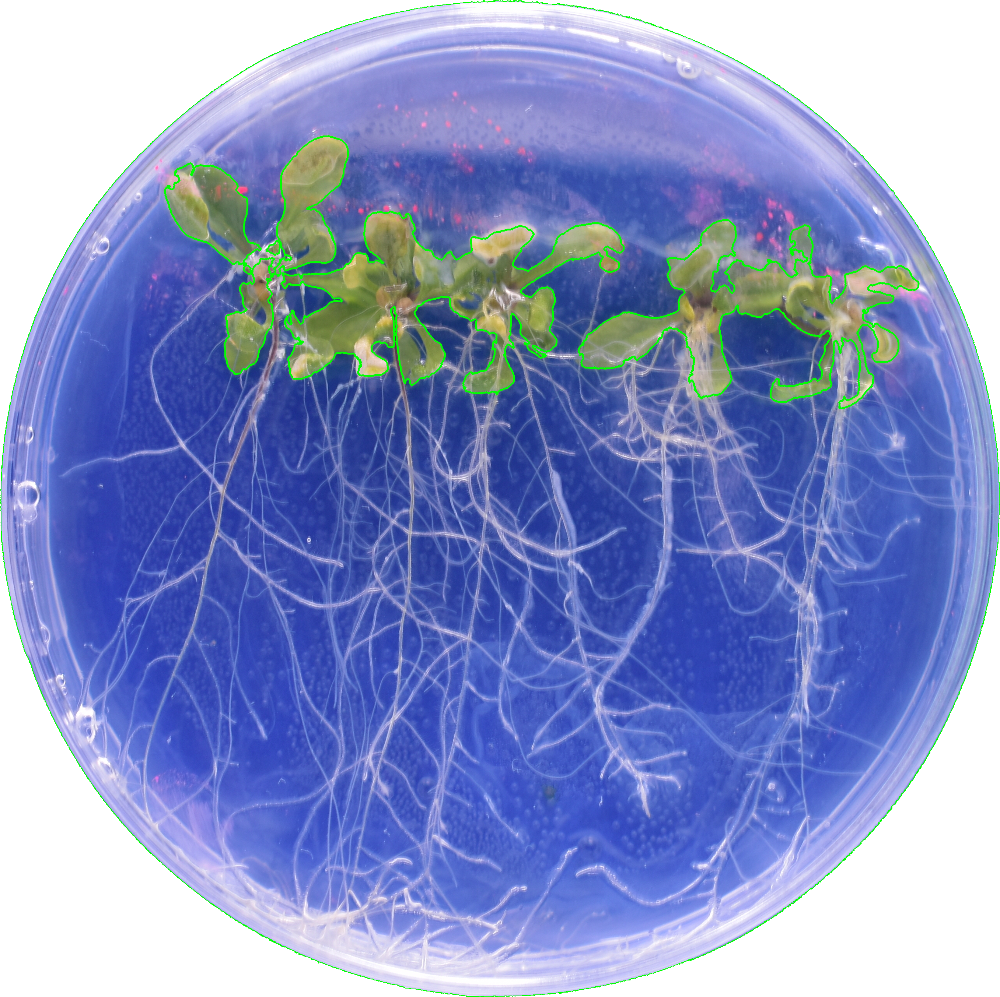

In [6]:
cv2_imshow(thresh_drowen1)